# Integration Fitzgerald2023 data and Atlas

Instead of indirectly comparing the datasets, lets merge them rightaway.

For simplicity, lets do fibroblasts only


One issue: Sequencing depth is vastly different, we sequenced much deeper

In [52]:
from tidyverse.dummy import *
import scanpy as sc
from sctools import pipeline, adata_merge
from sctools.scplotting import kneeplot_split
plt.rcParams['svg.fonttype'] = 'none'

import sys
sys.path.append('..')
from util import load_celltype, load_fitzgerald2023_fibroblasts

from sctools.pipeline import downsample, _downsample
def downsample_to_same_cell_depth(adata):
    adata.obs['n_molecules'] = adata.X.sum(1).A1
    # n_cells = adata.obs.query('n_molecules>1000').groupby('samplename').size()
    n_cells = adata.obs.groupby('samplename').size()
    n_mol = adata.obs.groupby('samplename').n_molecules.sum()
    umi_per_cell = n_mol/n_cells
    print(umi_per_cell)
    target_umi_per_cell = umi_per_cell.min()
    factor = target_umi_per_cell/ umi_per_cell
    
    target_nmol = n_mol*factor
    
    a_down = _downsample(adata, 'samplename', target_nmol.to_dict())
    return a_down

In [4]:
adata = load_fitzgerald2023_fibroblasts()
adata.var = adata.var.rename({'RGS5_ENSG00000143248': 'RGS5'}, axis=0)

# Load our own fibroblast/myofibroblast data

In [5]:
a_fibro = load_celltype('Fibroblasts')
a_fibro.obs['Study'] = 'CRUK'
a_fibro.obs['old_leiden'] = 'Fibroblast_' + a_fibro.obs['leiden'].astype(str)

a_myo =  load_celltype('Myofibroblasts')
a_myo.obs['Study'] = 'CRUK'
a_myo.obs['old_leiden'] = 'Myofib_' + a_myo.obs['leiden'].astype(str)

... storing 'Study' as categorical
... storing 'old_leiden' as categorical


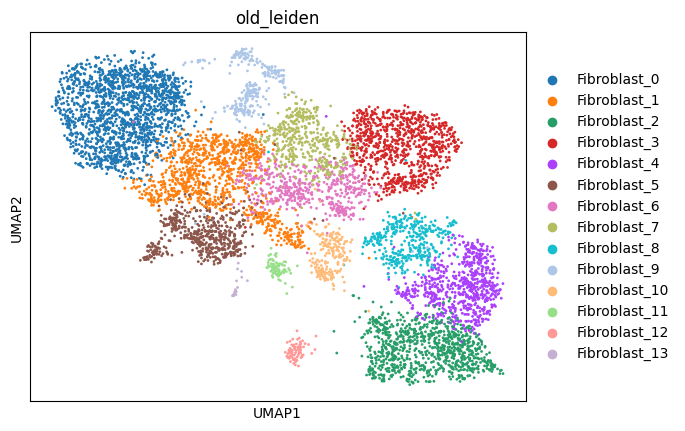

... storing 'Study' as categorical
... storing 'old_leiden' as categorical


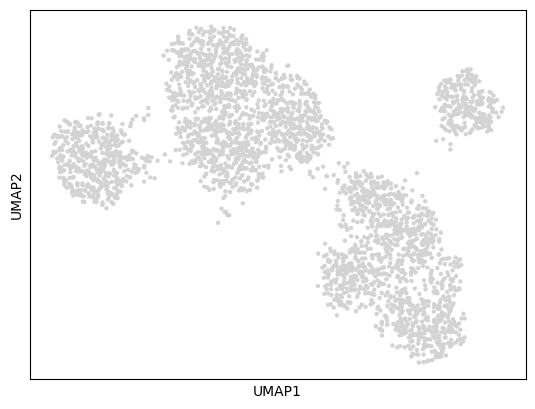

In [6]:
sc.pl.umap(a_fibro, color='old_leiden')
sc.pl.umap(a_myo)

In [7]:
shared_genes = sorted(list(set(a_fibro.var_names) & set(a_myo.var_names)  & set(adata.var_names)))
len(shared_genes)

19664

## Differermce in depth

/tmp/ipykernel_21523/1536202308.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/tmp/ipykernel_21523/1536202308.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/tmp/ipykernel_21523/1536202308.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to us

<Axes: ylabel='Density'>

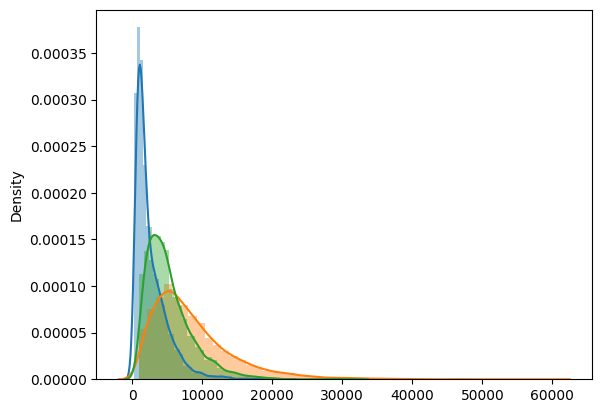

In [8]:
sns.distplot(adata.X.sum(1).A1)
sns.distplot(a_fibro.X.sum(1).A1)
sns.distplot(a_myo.X.sum(1).A1)

In [9]:
adata.X.sum(1).mean()

2646.5586

In [10]:
a_fibro.X.sum(1).mean()

8493.548

In [11]:
a_myo.X.sum(1).mean()

5261.4873

## Merge and adjust depth

In [12]:
A = adata_merge([adata[:, shared_genes], a_fibro[:, shared_genes],  a_myo[:, shared_genes]], security_check=False)
A.raw = A

sorting genes alphabetically
done sorting
ensuring compatibility
done ensuring compatibility


/opt/conda/lib/python3.11/site-packages/sctools/transforms.py:133: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


In [13]:
A.obs['n_molecules'] = A.X.sum(1).A1

... storing 'observation_joinid' as categorical


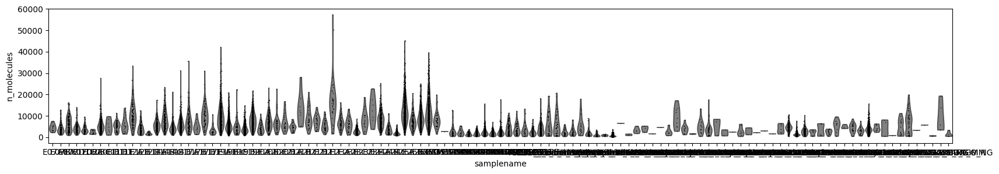

In [14]:
plt.figure(figsize=(20,3))
sc.pl.violin(A, keys=['n_molecules'], groupby='samplename', ax=plt.gca())

In [15]:
A = downsample_to_same_cell_depth(A)

/tmp/ipykernel_21523/1188889736.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/tmp/ipykernel_21523/1188889736.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


samplename
E07A                    4609.750000
E07B                    3871.628788
E07C                    6125.897590
E07D1                   4166.641379
E07D2                   3552.643678
                           ...     
Patient21_SIGAA1_GIM    3167.000000
Patient21_SIGAC1_NG     5749.000000
Patient22_SIGAE9_GIM     696.000000
Patient22_SIGAF9_CIM    9263.000000
Patient22_SIGAG9_NG     1277.400000
Length: 113, dtype: float64
sorting genes alphabetically
done sorting
ensuring compatibility
done ensuring compatibility


/opt/conda/lib/python3.11/site-packages/sctools/transforms.py:133: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


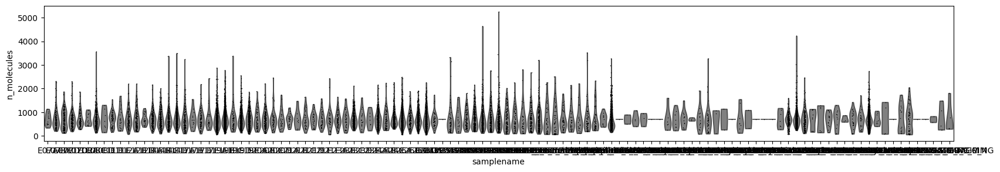

In [16]:
plt.figure(figsize=(20,3))
sc.pl.violin(A, keys=['n_molecules'], groupby='samplename', ax=plt.gca())

03/16/2025 07:35:08 PM annotating QC
03/16/2025 07:35:08 PM annotating and filtering for coding genes
03/16/2025 07:35:11 PM filtering cells for UMI content
03/16/2025 07:35:11 PM Cells: 16335 -> 16335
03/16/2025 07:35:11 PM filtering cells for mito content
03/16/2025 07:35:11 PM Cells: 16335 -> 16335
03/16/2025 07:35:11 PM Annotating Cell cycle
03/16/2025 07:35:11 PM calculating cell cycle phase
03/16/2025 07:35:11 PM computing score 'S_score'
03/16/2025 07:35:12 PM computing score 'G2M_score'
03/16/2025 07:35:12 PM     'phase', cell cycle phase (adata.obs)
03/16/2025 07:35:12 PM Done: Annotating Cell cycle
03/16/2025 07:35:12 PM Saving median n_molecules for normalization
03/16/2025 07:35:12 PM Zheng recipe
03/16/2025 07:35:13 PM Done: Zheng recipe
03/16/2025 07:35:13 PM PCA
03/16/2025 07:35:37 PM Harmony batch correction: uncorrected layout
03/16/2025 07:35:37 PM Neighbors
03/16/2025 07:36:06 PM Leiden
/opt/conda/lib/python3.11/site-packages/sctools/pipeline.py:238: FutureWarning: I

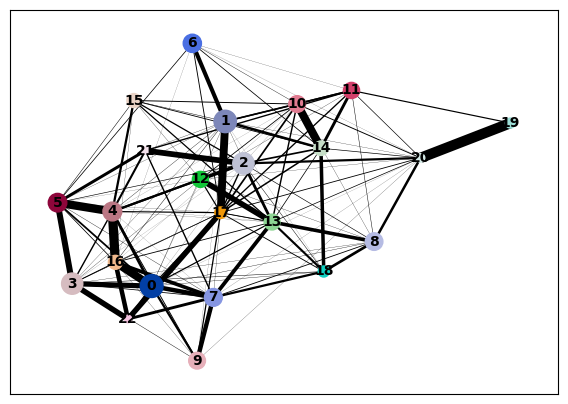

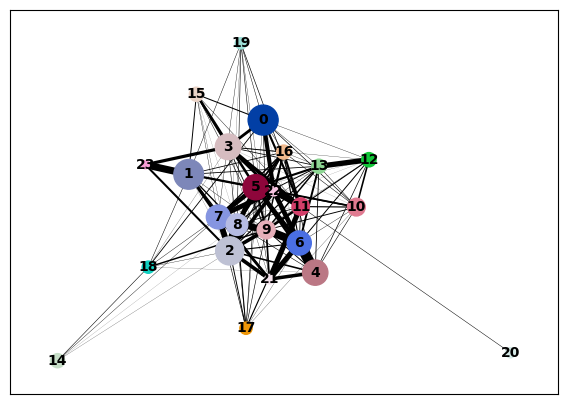

In [17]:
A = pipeline.michi_kallisto_recipe(A, umi_cutoff=1, harmony_correction='samplename')

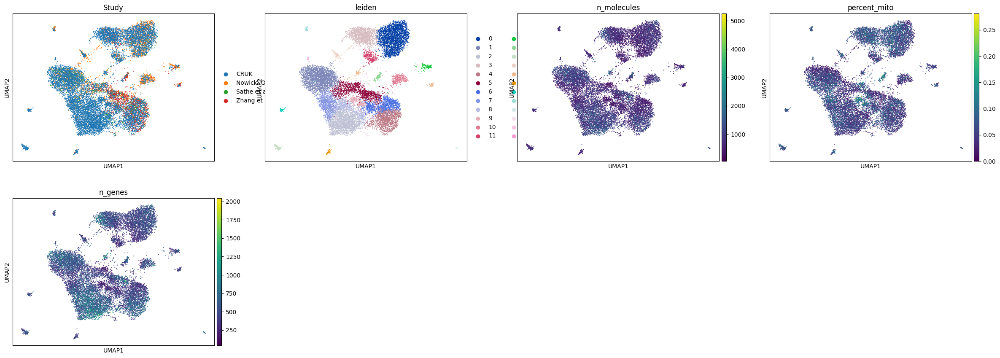

In [18]:
sc.pl.umap(A, color=['Study', 'leiden', 'n_molecules','percent_mito','n_genes'])
# sc.pl.embedding(A, basis='X_umap_nobatch', color=['Study', 'leiden', 'n_molecules','percent_mito','n_genes'])

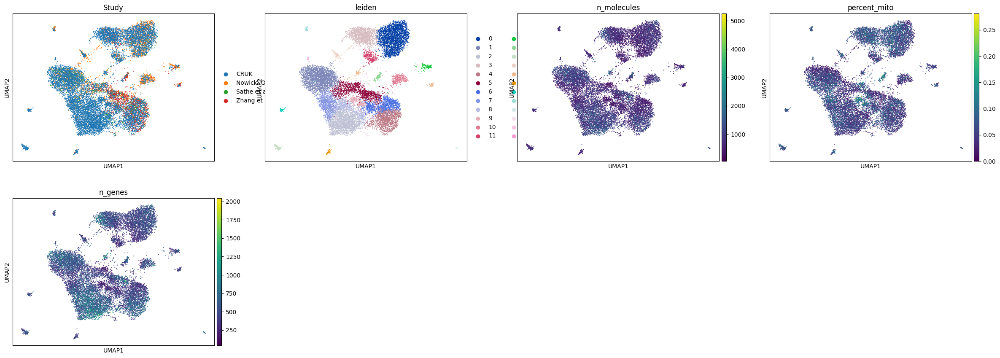

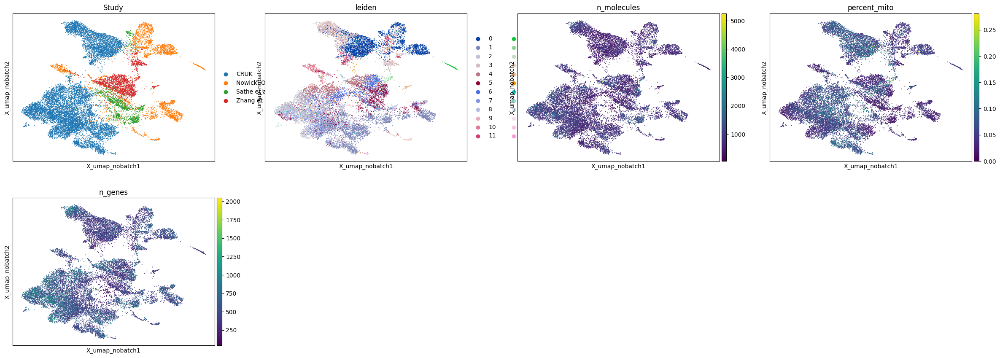

In [19]:
sc.pl.umap(A, color=['Study', 'leiden', 'n_molecules','percent_mito','n_genes'])
sc.pl.embedding(A, basis='X_umap_nobatch', color=['Study', 'leiden', 'n_molecules','percent_mito','n_genes'])

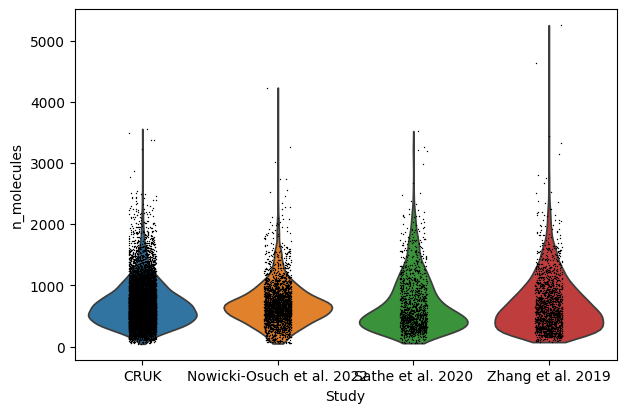

In [20]:
sc.pl.violin(A, keys=['n_molecules'], groupby='Study')

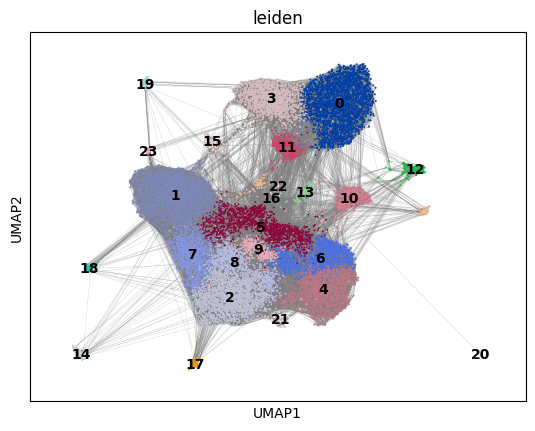

In [21]:
sc.pl.umap(A, color=['leiden'], legend_loc='on data', edges=True)

In [22]:
A.var.drop(['is_mito', 'is_ribo','is_coding'], axis=1, inplace=True)
A.obs = A.obs.drop(['sum', 'detected', 'MT.prop','sizeFactor', 'is_primary_data'], axis=1)

In [23]:
# A.write_h5ad('/proj/huang/tmp/fitzgerald_cruk_integrated.h5ad')

# analysis

In [24]:
# A = sc.read_h5ad('/proj/huang/tmp/fitzgerald_cruk_integrated.h5ad')

## Comparing the different studies

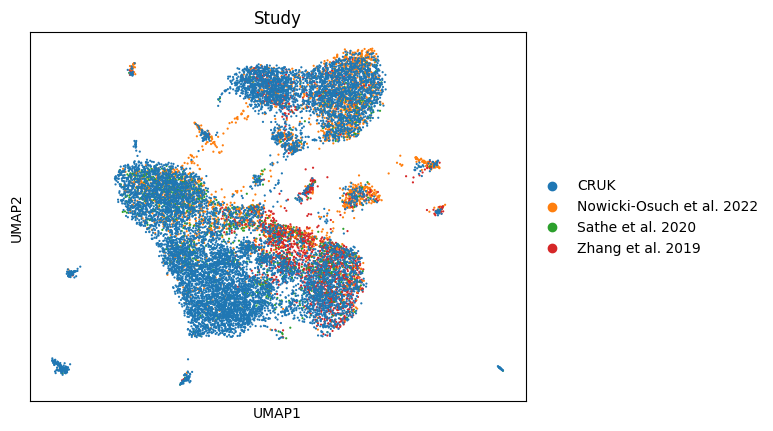

<Axes: title={'center': 'Study'}, xlabel='UMAP1', ylabel='UMAP2'>

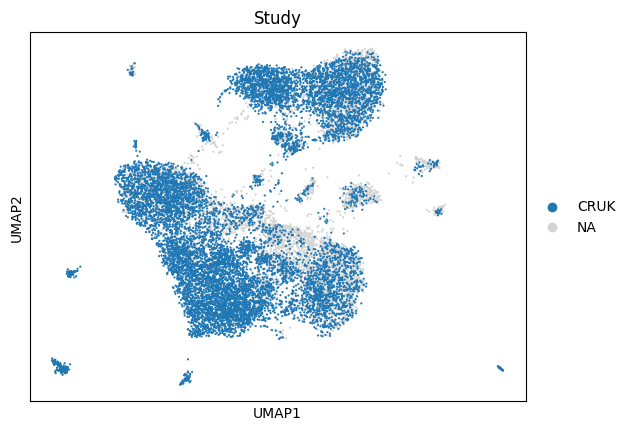

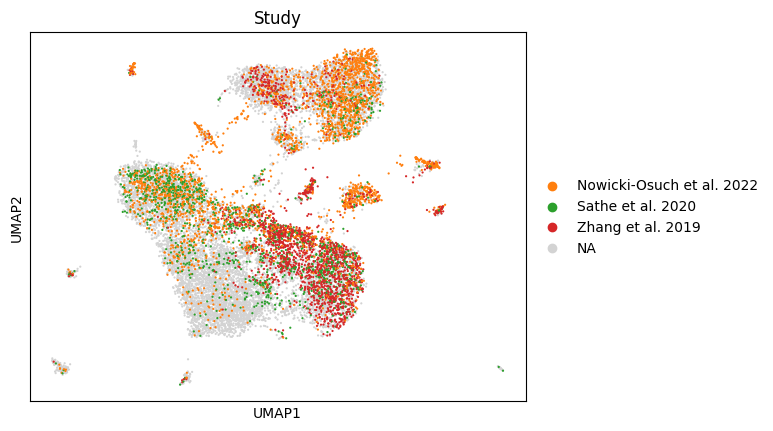

In [25]:
sc.pl.umap(A, color=['Study'], size=10)
# for s in A.obs.Study.unique():
#     sc.pl.umap(A, color=['Study'], groups=[s])

sc.pl.umap(A, color=['Study'], groups=['CRUK'], size=10, show=False)
# plt.savefig(f'./integration_umap_study_cruk.png')

sc.pl.umap(A, color=['Study'], groups=['Nowicki-Osuch et al. 2022', 'Zhang et al. 2019', 'Sathe et al. 2020'],size=10, show=False)
# plt.savefig(f'./integration_umap_study_rest.png')

<Axes: title={'center': 'tissue'}, xlabel='UMAP1', ylabel='UMAP2'>

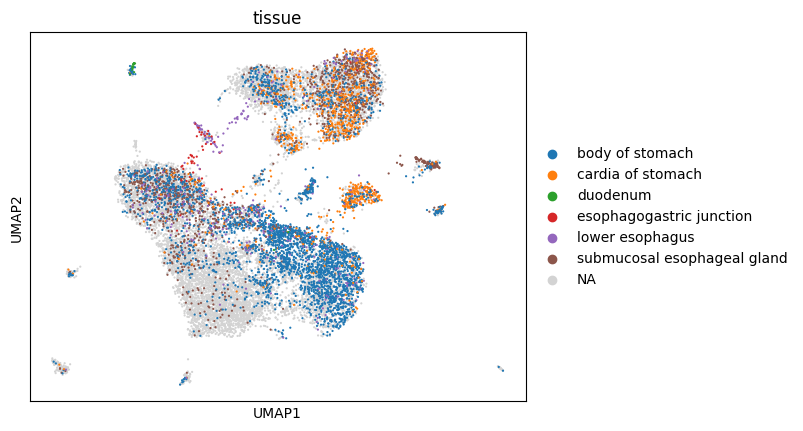

In [26]:
sc.pl.umap(A, color=['tissue'], size=10, show=False)
# plt.savefig(f'./integration_umap_tissue.png')

<Axes: title={'center': 'Patient_status'}, xlabel='UMAP1', ylabel='UMAP2'>

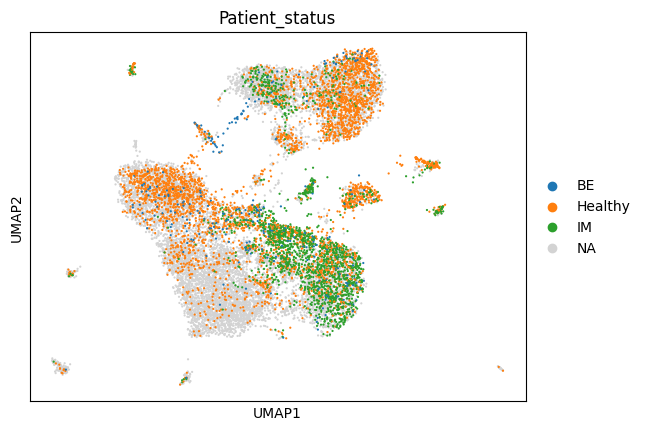

In [27]:
sc.pl.umap(A, color=['Patient_status'], size=10, show=False)
# plt.savefig(f'./integration_umap_status.png')

<Axes: title={'center': 'Patient_status'}, xlabel='UMAP1', ylabel='UMAP2'>

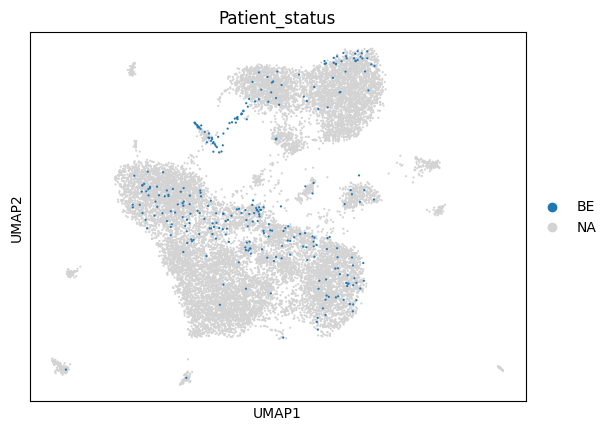

In [28]:
sc.pl.umap(A, color=['Patient_status'], groups=['BE'] ,size=10, show=False)

In [29]:
pd.crosstab(A.obs.Patient_status, A.obs.tissue)

tissue,body of stomach,cardia of stomach,duodenum,esophagogastric junction,lower esophagus,submucosal esophageal gland
Patient_status,,,,,,
BE,0,5,0,0,295,0
Healthy,1313,828,17,56,18,1443
IM,1736,43,0,0,0,0


<Axes: title={'center': 'procedure'}, xlabel='UMAP1', ylabel='UMAP2'>

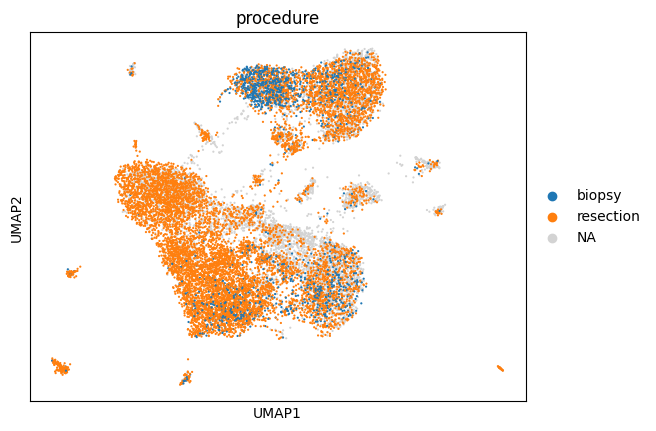

In [30]:
sc.pl.umap(A, color=['procedure'] ,size=10, show=False)

# MArkers from our paper

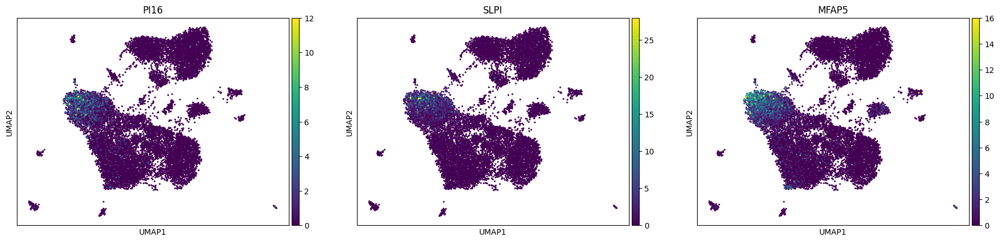

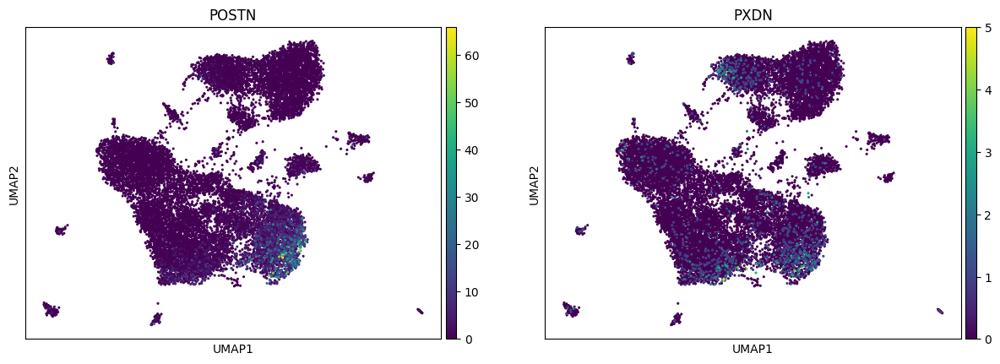

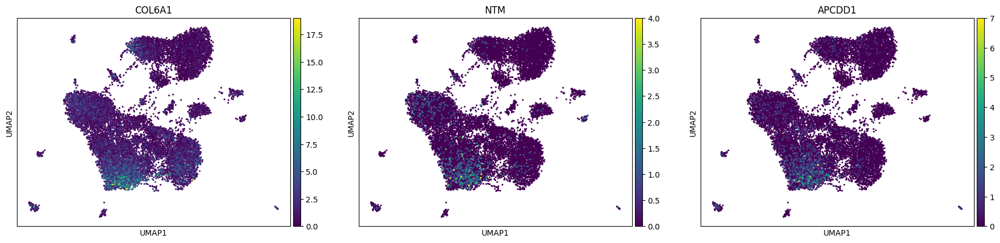

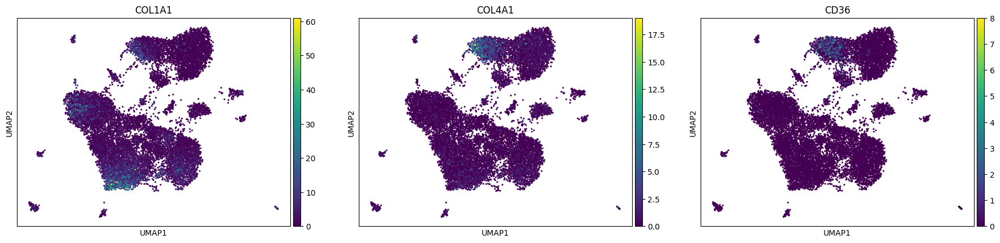

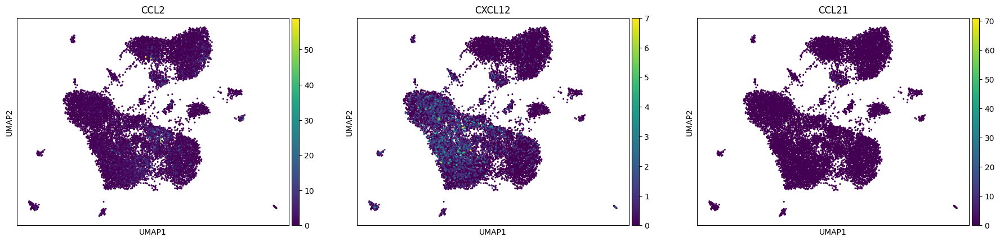

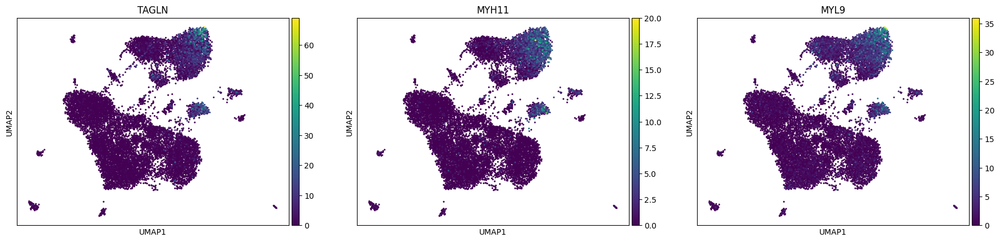

In [31]:
sc.pl.umap(A, color=['PI16','SLPI','MFAP5',], size=20)
sc.pl.umap(A, color=[ 'POSTN','PXDN'], size=20) # 'F3'
sc.pl.umap(A, color=[ 'COL6A1','NTM','APCDD1'], size=20)

# myofib markers
sc.pl.umap(A, color=['COL1A1', 'COL4A1', 'CD36'], size=20)  # pericyte
sc.pl.umap(A, color=['CCL2','CXCL12','CCL21'], size=20)  # 
sc.pl.umap(A, color=['TAGLN','MYH11', 'MYL9'], size=20)  # VSMC

In [32]:
# sc.pl.umap(A, color=['PI16','SLPI','MFAP5',], vmax=[90, 70, 100], use_raw=True)
# sc.pl.umap(A, color=[ 'POSTN','PXDN'], vmax=[100, 25,5]) # 'F3'
# sc.pl.umap(A, color=[ 'COL6A1','NTM','APCDD1'], vmax=[100, 25,5])

# # myofib markers
# sc.pl.umap(A, color=['COL1A1', 'COL4A1', 'CD36'], vmax=[50,12,12])  # pericyte
# sc.pl.umap(A, color=['CCL2','CXCL12','CCL21'], vmax= [100,30,100])  # 
# sc.pl.umap(A, color=['TAGLN','MYH11', 'MYL9'])  # VSMC

### our mrakers

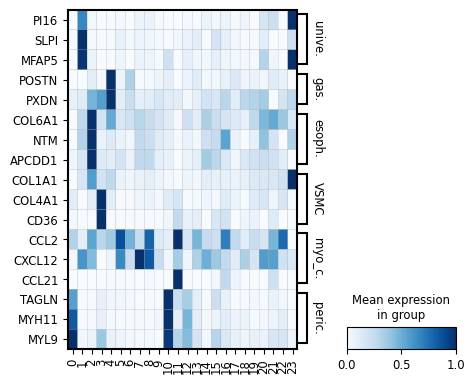

In [33]:
genes_dict = {
    'universal': ['PI16','SLPI','MFAP5'],
    'gastric': ['POSTN','PXDN'], #'F3',
    'esophagus':['COL6A1','NTM','APCDD1'],
    'VSMC': ['COL1A1', 'COL4A1', 'CD36'], 
    'myo_cytokine': ['CCL2','CXCL12','CCL21'],
    'pericyte':['TAGLN','MYH11', 'MYL9']
}
sc.pl.matrixplot(A, var_names=genes_dict, groupby='leiden', standard_scale='var', swap_axes=True, show=False, #order=cluster_order
                figsize=(5,4), cmap='Blues');
plt.savefig(f'./integration_markers_matrix.svg')

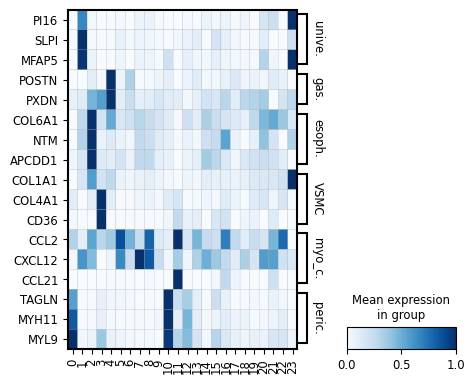

In [35]:
genes_dict = {
    'universal': ['PI16','SLPI','MFAP5'],
    'gastric': ['POSTN','PXDN'], # 'F3',
    'esophagus':['COL6A1','NTM','APCDD1'],
    'VSMC': ['COL1A1', 'COL4A1', 'CD36'], 
    'myo_cytokine': ['CCL2','CXCL12','CCL21'],
    'pericyte':['TAGLN','MYH11', 'MYL9']
}
sc.pl.matrixplot(A, var_names=genes_dict, groupby='leiden', standard_scale='var', swap_axes=True, show=False, #order=cluster_order
                figsize=(5,4), cmap='Blues');
plt.savefig(f'./integration_markers_matrix.svg')

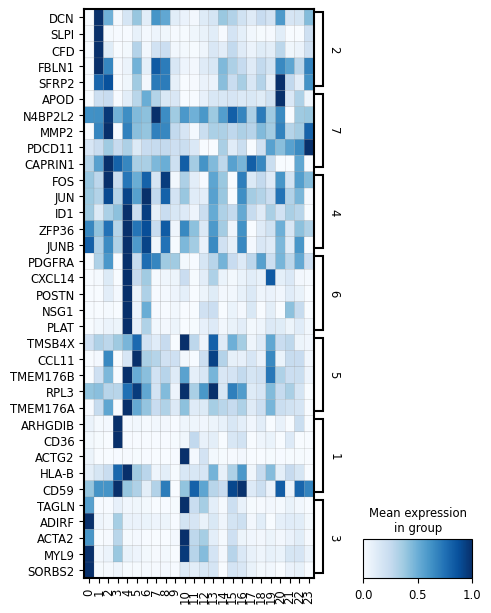

In [36]:
### their markers
genes_dict = {
'2' : ['DCN','SLPI','CFD','FBLN1', 'SFRP2'],
'7': ['APOD','N4BP2L2', 'MMP2','PDCD11','CAPRIN1'],
'4': ['FOS','JUN', 'ID1','ZFP36', 'JUNB'],
'6': ['PDGFRA','CXCL14','POSTN','NSG1','PLAT'],
'5': ['TMSB4X','CCL11','TMEM176B', 'RPL3', 'TMEM176A'],
'1': ['ARHGDIB','CD36','ACTG2','HLA-B','CD59'],
'3': ['TAGLN','ADIRF','ACTA2','MYL9', 'SORBS2'],
}

sc.pl.matrixplot(A, var_names=genes_dict, groupby='leiden', standard_scale='var', swap_axes=True, show=False, #order=cluster_order
                figsize=(5,7), cmap='Blues');

In [37]:
pipeline.differential_expression_michi_kallisto_recipe(A, groupby='leiden')

03/16/2025 07:39:09 PM doing csr->csc
03/16/2025 07:39:09 PM done csr->csc
03/16/2025 07:39:09 PM Actual DE analysis via `rank_genes_groups`
/opt/conda/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
/opt/conda/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
/opt/conda/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:434: PerformanceWarning: DataFrame is highly fragmented.  This is usua

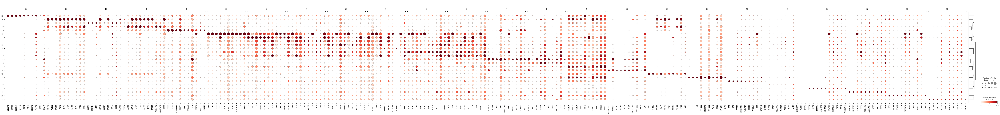

In [38]:
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var')

In [39]:
from sctools.scplotting import recolor, godsnot_64

In [40]:
recolor(A, 'old_leiden', godsnot_64)

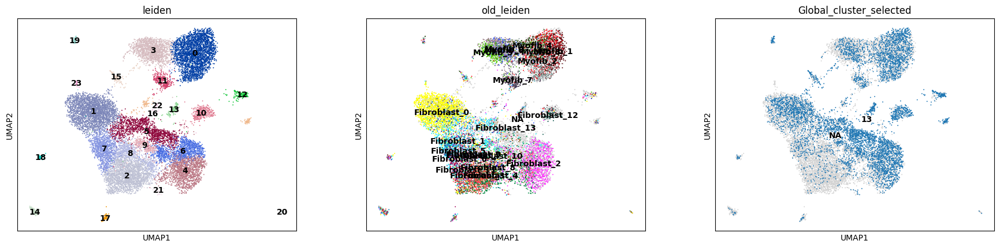

In [41]:
sc.pl.umap(A, color=['leiden', 'old_leiden', 'Global_cluster_selected'], legend_loc='on data')

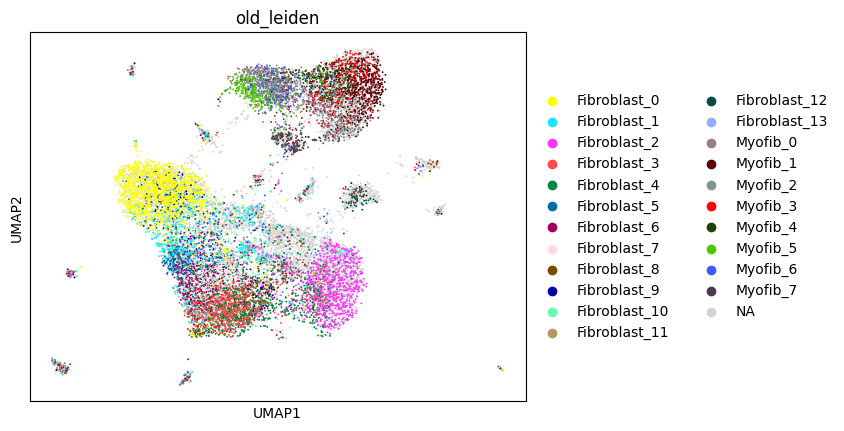

In [42]:
sc.pl.umap(A, color=['old_leiden'],)

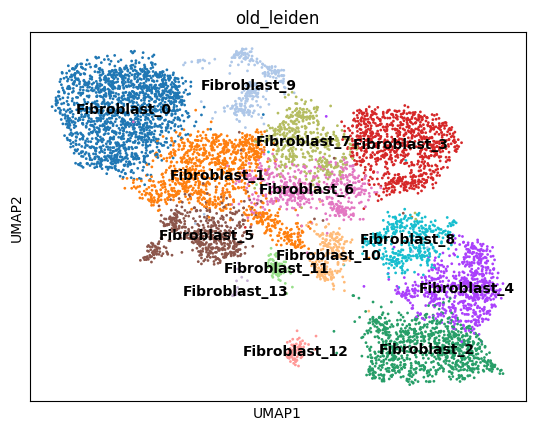

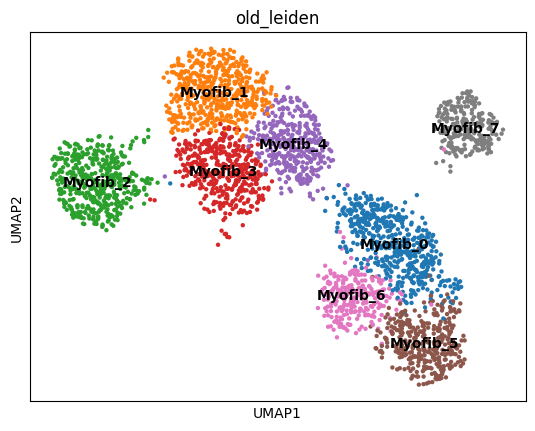

In [43]:
sc.pl.umap(a_fibro, color=['old_leiden'], legend_loc='on data')
sc.pl.umap(a_myo, color=['old_leiden'], legend_loc='on data')

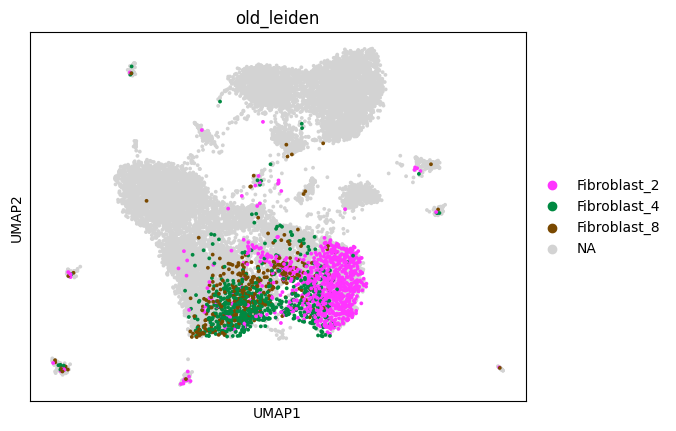

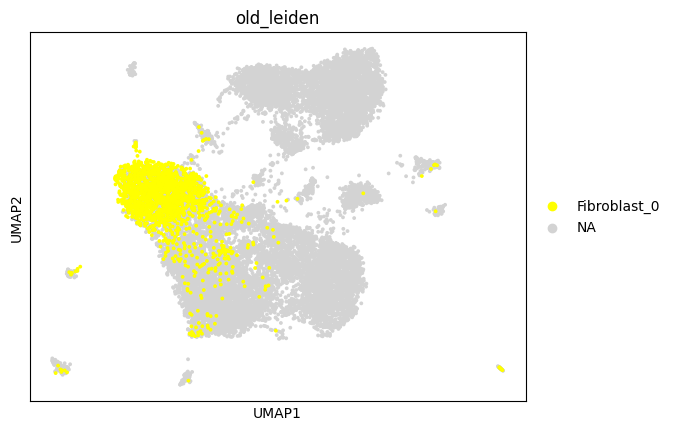

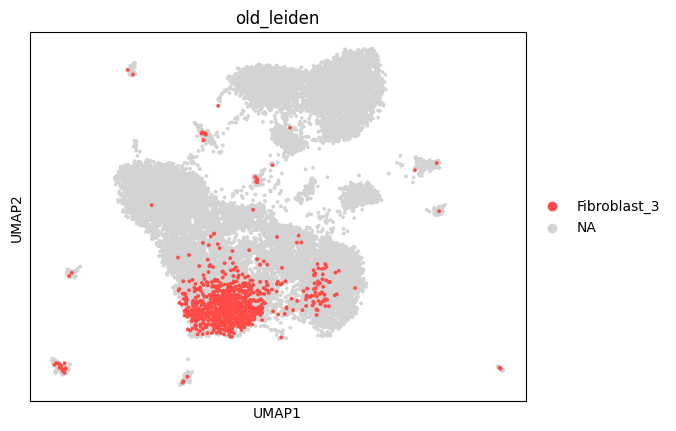

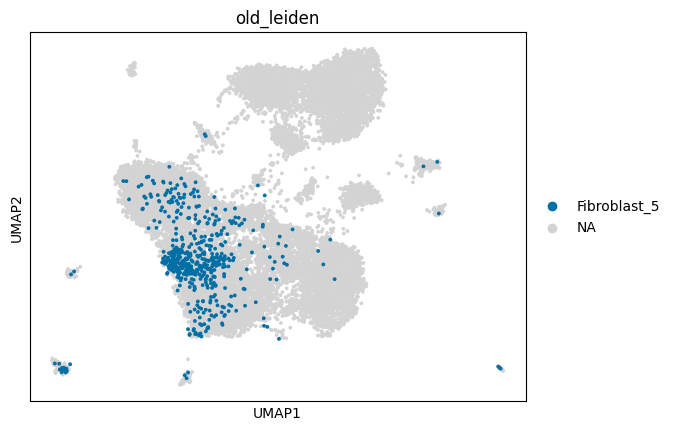

In [44]:
sc.pl.umap(A, color=['old_leiden'], groups=['Fibroblast_2','Fibroblast_4','Fibroblast_8'], size=30)
sc.pl.umap(A, color=['old_leiden'], groups=['Fibroblast_0'], size=30)
sc.pl.umap(A, color=['old_leiden'], groups=['Fibroblast_3'], size=30)
sc.pl.umap(A, color=['old_leiden'], groups=['Fibroblast_5'], size=30)

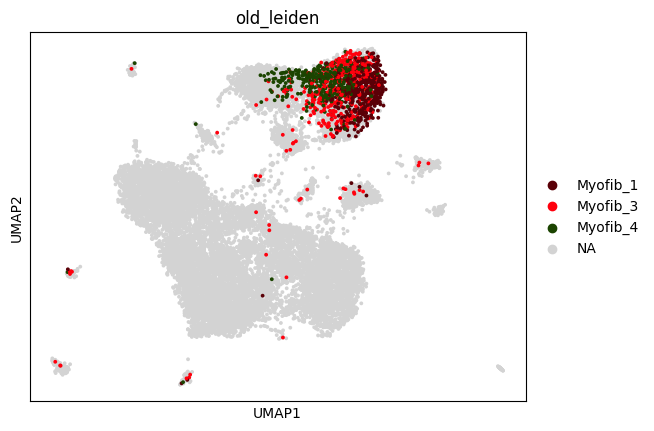

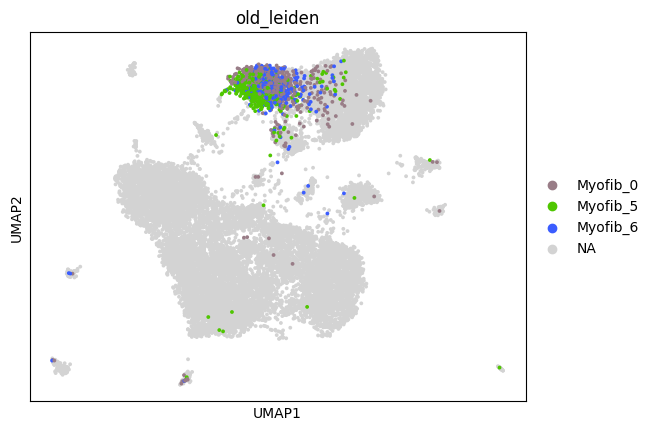

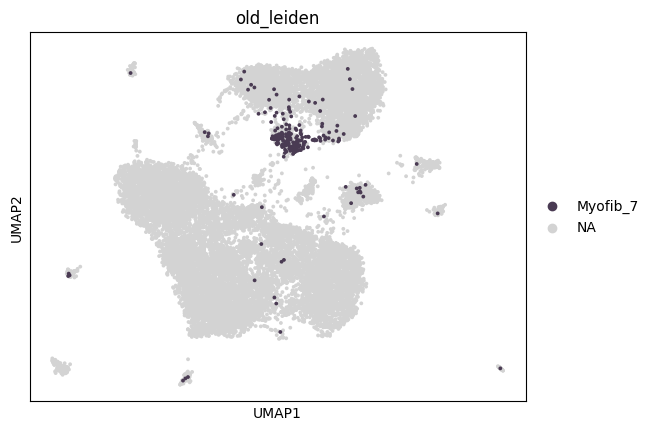

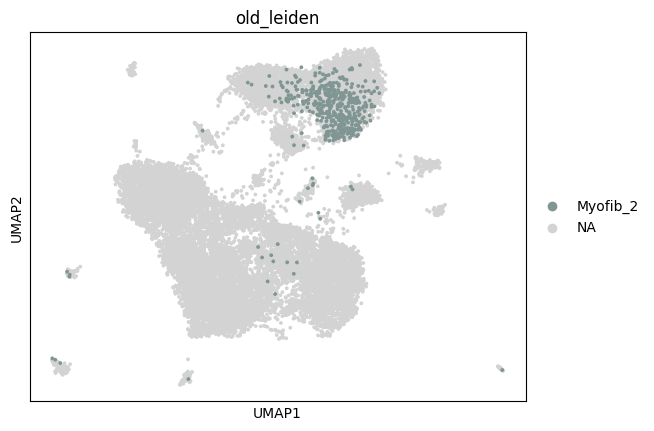

In [45]:
sc.pl.umap(A, color=['old_leiden'], groups=['Myofib_1','Myofib_3','Myofib_4'], size=30)
sc.pl.umap(A, color=['old_leiden'], groups=['Myofib_0','Myofib_5','Myofib_6'], size=30) #groups=['2','4','8'])
sc.pl.umap(A, color=['old_leiden'], groups=['Myofib_7'], size=30)
sc.pl.umap(A, color=['old_leiden'], groups=['Myofib_2'], size=30)

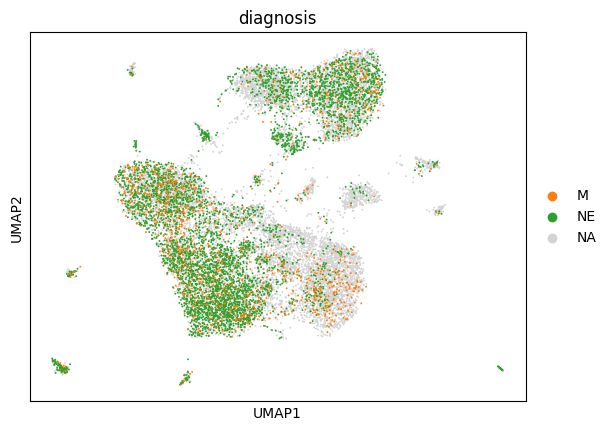

In [46]:
sc.pl.umap(A, color=['diagnosis'], vmax=10, groups=['NE', 'M'])

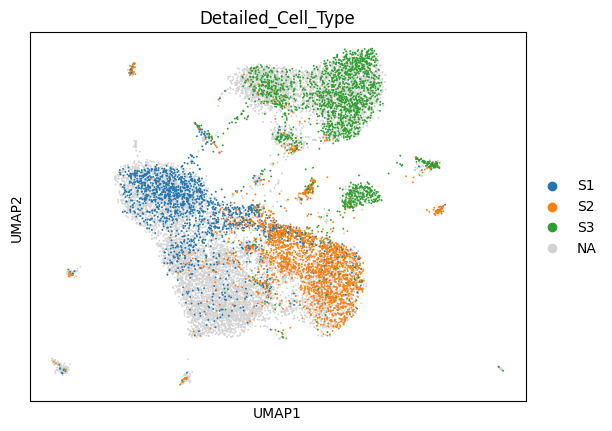

In [47]:
sc.pl.umap(A, color=['Detailed_Cell_Type'], vmax=10, show=False)
plt.savefig(f'./integration_umap_S1S2S3.png')

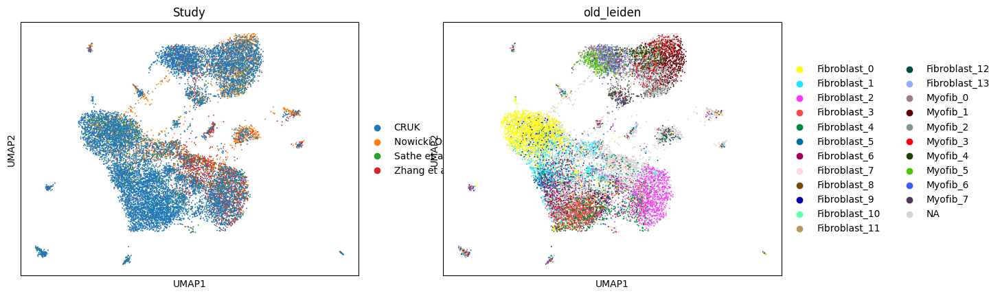

In [48]:
sc.pl.umap(A, color=['Study', 'old_leiden'])

# Markers from Lee et al.
see [Apposition of fibroblasts with metaplastic gastric cells promotes dysplastic transition](https://www.gastrojournal.org/article/S0016-5085(23)00731-X/fulltext)


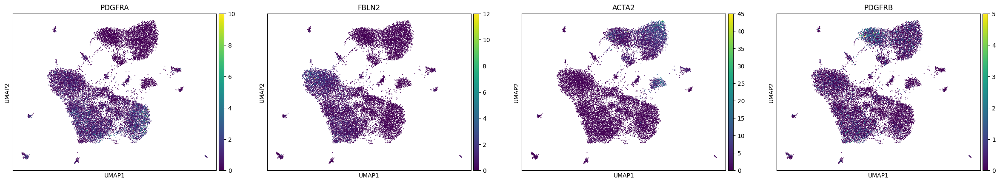

In [49]:
sc.pl.umap(A, color=['PDGFRA','FBLN2','ACTA2','PDGFRB'], use_raw=True)

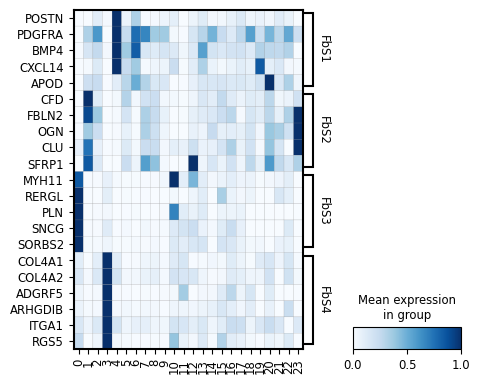

In [50]:
genes_dict = {
    'FbS1': ['POSTN','PDGFRA','BMP4','CXCL14','APOD'],
    'FbS2': ['CFD','FBLN2','OGN','CLU', 'SFRP1'],
    'FbS3':['MYH11', 'RERGL','PLN','SNCG','SORBS2'],
    'FbS4': ['COL4A1', 'COL4A2', 'ADGRF5','ARHGDIB','ITGA1', 'RGS5'], 
}
sc.pl.matrixplot(A, var_names=genes_dict, groupby='leiden', standard_scale='var', swap_axes=True, show=False, #order=cluster_order
                figsize=(5,4), cmap='Blues');
plt.savefig(f'./Lee_et_all_integration_markers_matrix.svg')

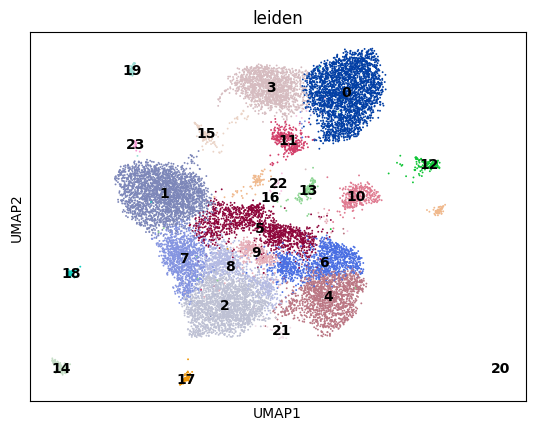

In [51]:
sc.pl.umap(A, color=['leiden'], legend_loc='on data')